    - This project involves the binary classification of MRI images using deep learning. Since I was not familiar with managing DICOM series and faced challenges in implementing certain parts, I utilized the assistance of ChatGPT.
    - **Important**: Cells from 41 onward are not fully rendered on GitHub. Please download the notebook and open it in a local environment or use an external viewer to access the complete content.

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, random_split
import torchvision.transforms.v2 as v2
from sklearn.metrics import auc, roc_curve, precision_recall_curve, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import cv2
import os
import glob
import pydicom
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import random
import warnings

warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [3]:
pd.set_option('display.max_colwidth', None)

In [4]:
def set_seed(seed):
    # Set the random seed for Python's built-in random module
    random.seed(seed)
    
    # Set the random seed for NumPy
    np.random.seed(seed)
    
    # Set the random seed for PyTorch
    torch.manual_seed(seed)
    
    # If you are using GPU
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # If you are using multiple GPUs
        
        # Ensure that the cuDNN library uses deterministic algorithms
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

# Example usage
seed = 42
set_seed(seed)

# utils

In [5]:
def plot_single_dicom(path):
    # Reading DICOM file
    dicom_data = pydicom.dcmread(path)
    # Display the image
    plt.imshow(dicom_data.pixel_array, cmap=plt.cm.bone)
    plt.show()

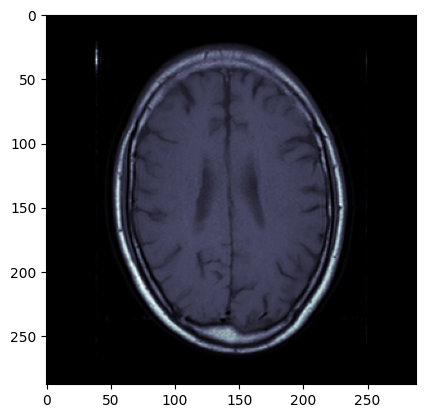

In [6]:
path = "/kaggle/input/iaaa-mri-challenge/data/1.3.46.670589.11.10042.5.0.1412.2024020313401387235/1.3.46.670589.11.10042.5.0.1412.2024020313411415275.dcm"
plot_single_dicom(path)

In [7]:
def plot_dicom_series(path):
    dicom_dir = path

    dicom_files_pattern = dicom_dir + '/*.dcm'

    dicom_files = sorted(glob.glob(dicom_files_pattern))

    length = len(dicom_files)
    if length == 16:
        fig, ax = plt.subplots(4, 4, figsize=(15, 8))
    else:
        fig, ax = plt.subplots(3, 6, figsize=(15, 8))
    ax = ax.flatten()

    for index, dicom_file in enumerate(dicom_files):
        dicom_image = pydicom.dcmread(dicom_file)
        pixel_array = dicom_image.pixel_array

        ax[index].imshow(pixel_array, cmap='gray')
        ax[index].axis('off')

    plt.show()

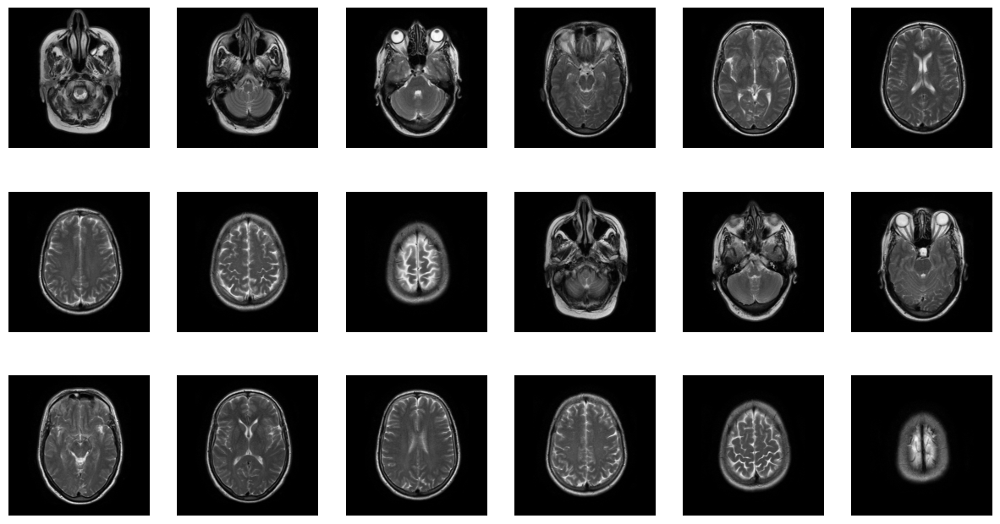

In [8]:
path = "/kaggle/input/iaaa-mri-challenge/data/1.3.46.670589.11.10042.5.0.1412.2024020322113060815"
plot_dicom_series(path)

# Data Preprocessing

## csv file

In [9]:
labels = pd.read_csv("/kaggle/input/iaaa-mri-challenge/train.csv")
labels.sample(4)

,SeriesInstanceUID,prediction
1909,1.3.46.670589.11.10042.5.0.7476.2024021009540375990,0
2647,1.3.46.670589.11.10042.5.0.4960.2023123020593029670,0
178,1.3.46.670589.11.10042.5.0.4776.2024021816144257448,0
485,1.3.46.670589.11.10042.5.0.5484.2024030313323231788,0


In [10]:
print(f"len abnoramal instance : {len(labels[labels['prediction'] == 1])}")
print(f"len normal instance : {len(labels[labels['prediction'] == 0])}")

len abnoramal instance : 391
len normal instance : 2741


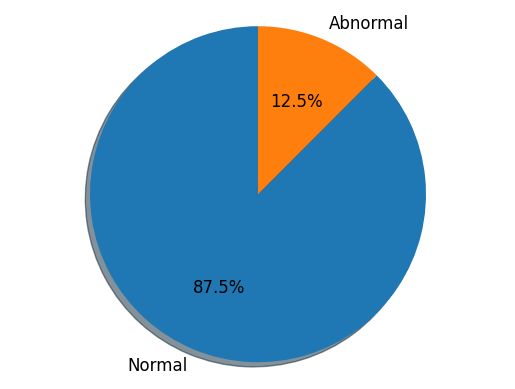

In [11]:
counts = labels['prediction'].value_counts()
plt.pie(counts, labels=["Normal", "Abnormal"], autopct='%1.1f%%', startangle=90,
        textprops={'fontsize': 12}, labeldistance=1.1, shadow=True)
plt.axis('equal')
#plt.title('', fontsize=14)
plt.show()

In [12]:
# Compute class weights
classes = np.array([0, 1])
y = np.array(labels["prediction"])
class_weights = compute_class_weight(class_weight="balanced", classes=classes, y=y)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)
print(f"Class weights: normal= {round(float(class_weights_tensor[0]), 3)}, abnormal= {round(float(class_weights_tensor[1]), 3)}")

Class weights: normal= 0.571, abnormal= 4.005


## Adding "Series Description", "Series Count", "PersonID", "Plane" to csv files

In [13]:
# Determines the orientation of a medical image based on its orientation matrix.
def determine_orientation(image_orientation):
    # Define standard orientations (approximate)
    axial = np.array([1, 0, 0, 0, 1, 0])
    coronal = np.array([1, 0, 0, 0, 0, -1])
    sagittal = np.array([0, 1, 0, 0, 0, -1])
    
    # Convert the orientation list to a numpy array
    orientation = np.array(image_orientation)
    
    # Calculate the difference (L2 norm) between the provided orientation and standard orientations
    axial_diff = np.linalg.norm(orientation - axial)
    coronal_diff = np.linalg.norm(orientation - coronal)
    sagittal_diff = np.linalg.norm(orientation - sagittal)
    
    # Determine which orientation is the closest match
    if min(axial_diff, coronal_diff, sagittal_diff) == axial_diff:
        return "Axial"
    elif min(axial_diff, coronal_diff, sagittal_diff) == coronal_diff:
        return "Coronal"
    elif min(axial_diff, coronal_diff, sagittal_diff) == sagittal_diff:
        return "Sagittal"
    else:
        return "Oblique or Unknown"

In [14]:
# Extracts information about a DICOM series from the provided directory.
def get_series_info(dicom_series_path):
    series_description = "No Series Description"
    series_count = 0
    plane = "Unknown"
    
    try:
        # Count all DICOM files in the series directory and get one description
        dicom_files = [f for f in os.listdir(dicom_series_path) if f.endswith(".dcm")]
        series_count = len(dicom_files)
        
        # Read the first DICOM file to get the series description and plane information
        if dicom_files:
            dicom_file_path = os.path.join(dicom_series_path, dicom_files[0])
            ds = pydicom.dcmread(dicom_file_path)
            series_description = ds.get((0x0008, 0x103E), "No Series Description").value 
            
            # Determine the plane using the provided function
            if hasattr(ds, 'ImageOrientationPatient'):
                plane = determine_orientation(ds.ImageOrientationPatient)
            else:
                plane = "Unknown"
    except Exception as e:
        print(f"Failed to read {dicom_series_path}: {e}")
            
    return series_description, series_count, plane

In [15]:
def get_patient_id_from_dicom(series_path):
    try:
        # List DICOM files in the given directory
        dicom_files = [f for f in os.listdir(series_path) if f.endswith('.dcm')]
        if dicom_files:
            first_dicom_path = os.path.join(series_path, dicom_files[0])
            ds = pydicom.dcmread(first_dicom_path)
            return ds.PatientID
    except Exception as e:
        print(f"Error accessing DICOM file to extract PatientID: {e}")
    return "Unknown Patient ID"

In [16]:
# Path to CSV file
csv_path = "/kaggle/input/iaaa-mri-challenge/train.csv"
# Path to DICOM series directory
directory_path = "/kaggle/input/iaaa-mri-challenge/data"

# Load the main CSV file
df = pd.read_csv(csv_path)

# Add new columns for "Series Description", "Series Count", "Person ID", and "Plane"
df['Series Description'] = None
df['Series Count'] = None
df['Person ID'] = None
df['Plane'] = None

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    series_instance_uid = row["SeriesInstanceUID"]
    series_path = os.path.join(directory_path, series_instance_uid)
    
    if os.path.exists(series_path) and os.path.isdir(series_path):
        description, count, plane = get_series_info(series_path)
        df.at[index, "Series Description"] = description
        df.at[index, 'Series Count'] = count
        df.at[index, "Plane"] = plane
        
        person_id = get_patient_id_from_dicom(series_path)
        df.at[index, "Person ID"] = person_id
    else:
        print(f"Directory not found for SeriesInstanceUID: {series_instance_uid}")

# EDA

In [17]:
# finding "Person ID" that are different in "prediction" column.
df.groupby('Person ID').filter(lambda x: len(x['prediction'].unique()) > 1)

,SeriesInstanceUID,prediction,Series Description,Series Count,Person ID,Plane
900,1.3.46.670589.11.10042.5.0.4776.2024021707280678148,1,T2W_TSE,16,680515,Axial
901,1.3.46.670589.11.10042.5.0.4776.2024021707290198149,0,T1W_SE,16,680515,Axial
902,1.3.46.670589.11.10042.5.0.4776.2024021707300190180,1,T2W_FLAIR,16,680515,Axial
1224,1.3.46.670589.11.10042.5.0.7984.2024022407234101045,0,T2W_FLAIR,16,253301,Axial
1225,1.3.46.670589.11.10042.5.0.7984.2024022407205182924,1,T2W_TSE,16,253301,Axial
1226,1.3.46.670589.11.10042.5.0.7984.2024022407221889956,0,T1W_SE,16,253301,Axial
1689,1.3.46.670589.11.10042.5.0.5556.2024030116192943215,1,T2W_TSE,18,255203,Axial
1690,1.3.46.670589.11.10042.5.0.5556.2024030116202689216,0,T1W_SE,18,255203,Axial
1691,1.3.46.670589.11.10042.5.0.5556.2024030116213418249,1,T2W_FLAIR,18,255203,Axial
1731,1.3.46.670589.11.10042.5.0.7864.2023122012040315216,1,T2W_FLAIR,16,674274,Axial


In [18]:
# Which one of the patient in the dataset has different number of DICOM series (between T1, T2, T2-FLAIR).
results = df.groupby('Person ID')['Series Count'].nunique() == 1
false_results = results[results == False]
len(false_results), false_results

(32,
 Person ID
 15079     False
 160228    False
 172102    False
 18243     False
 331150    False
 353602    False
 394655    False
 463627    False
 501539    False
 534891    False
 591219    False
 599987    False
 617061    False
 669937    False
 673618    False
 673787    False
 675186    False
 675666    False
 675668    False
 676814    False
 677774    False
 678714    False
 679099    False
 679316    False
 679319    False
 680819    False
 682168    False
 682452    False
 684638    False
 687168    False
 687380    False
 94138     False
 Name: Series Count, dtype: bool)

In [19]:
# Which one of the persons in the dataset doesn't have "T2W_TSE", "T1W_SE", "T2W_FLAIR" series
required_descriptions = {"T2W_TSE", "T1W_SE", "T2W_FLAIR"}
results = df.groupby("Person ID")['Series Description'].apply(lambda descriptions: required_descriptions.issubset(set(descriptions)))
false_results = results[results == False]
false_results

Series([], Name: Series Description, dtype: bool)

In [20]:
df['Series Description'].value_counts()

Series Description
T2W_TSE      1044
T1W_SE       1044
T2W_FLAIR    1044
Name: count, dtype: int64

In [21]:
df['Series Count'].unique()

array([16, 18, 20, 14, 17, 8, 13], dtype=object)

In [22]:
df['Series Count'].value_counts()

Series Count
16    2008
18    1054
17      39
20      24
8        3
14       2
13       2
Name: count, dtype: int64

In [23]:
df[df['Series Description'] == "T2W_TSE"]['Series Count'].value_counts()

Series Count
16    661
18    362
17     13
20      8
Name: count, dtype: int64

In [24]:
df[df['Series Description'] == "T1W_SE"]['Series Count'].value_counts()

Series Count
16    673
18    349
17     12
20      8
14      1
13      1
Name: count, dtype: int64

In [25]:
df[df['Series Description'] == "T2W_FLAIR"]['Series Count'].value_counts()

Series Count
16    674
18    343
17     14
20      8
8       3
14      1
13      1
Name: count, dtype: int64

In [26]:
# I'll drop the rows whihc are not "Axial"
df["Plane"].value_counts()

Plane
Axial       3121
Sagittal       8
Coronal        3
Name: count, dtype: int64

# Getting csv files

In [27]:
# Filter the DataFrame to include only rows where the "Plane" is "Axial"
# becuase there're few datas that are "Sagittal" or "Coronal" so they may hurt the performance of the model (they're too small to be learned from)
df_axial = df[df["Plane"] == "Axial"]

# creating 3 different training data to train 3 different models based on "Series Description"
T1_dataframe = df_axial[df_axial['Series Description'] == "T1W_SE"]
T1_dataframe.to_csv("/kaggle/working/T1.csv", index=False)

T2_dataframe = df_axial[df_axial['Series Description'] == "T2W_TSE"]
T2_dataframe.to_csv("/kaggle/working/T2.csv", index=False)

T2FLAIR_dataframe = df_axial[df_axial['Series Description'] == "T2W_FLAIR"]
T2FLAIR_dataframe.to_csv("/kaggle/working/T2FLAIR.csv", index=False)

# Dataset

In [28]:
# # Define the transformations
# transformation = v2.Compose([
#     v2.ToPILImage(),
#     v2.Resize((128, 128)),  # Resize the image to 128x128 pixels
#     v2.ToImage(),          # Convert the image to a PyTorch tensor
#     v2.ToDtype(torch.float32, scale=False)])

In [29]:
# Define the transformations
def transform_image(image):
    # Ensure image is a numpy array of type float32
    image = image.astype(np.float32)
    # Resize using OpenCV
    image_resized = cv2.resize(image, (128, 128), interpolation=cv2.INTER_AREA)
    # If needed, expand dimensions to match expected input shape
    if image_resized.ndim == 2:
        image_resized = np.expand_dims(image_resized, axis=0)  # Add channel dimension
    return image_resized

In [30]:
batch_size = 8

## dataset class

In [31]:
class DicomDatasetBatchWiseHandling(Dataset):
    def __init__(self, folder_list, dicom_dir, mean=None, std=None, transform=None, conv=None):
        self.folder_list = folder_list
        self.dicom_dir = dicom_dir
        self.mean = mean
        self.std = std
        self.transform = transform
        self.conv = conv

    def __len__(self):
        return len(self.folder_list)

    def __getitem__(self, idx):
        folder_name, label = self.folder_list[idx]
        folder_path = os.path.join(self.dicom_dir, folder_name)
        dicom_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')]
        
        # sorting the slices to have consistent order
        slices = []
        for f in dicom_files:
            ds = pydicom.dcmread(f)
            position = ds.ImagePositionPatient[2] if 'ImagePositionPatient' in ds else float('inf')
            slice_array = ds.pixel_array.astype(np.float32)
            slices.append((position, slice_array))
        slices.sort(key=lambda x: x[0], reverse=True)
    
        # removing the blank area around the skull
        cropped_slices = [self.isolate_skull(slc[1]) for slc in slices]
        
        # Applying transformation
        if self.transform:
            cropped_slices = [self.transform(slc) for slc in cropped_slices]        
            
        # Z-score normalization of the volume using mean and std
        if self.mean is not None and self.std is not None:
            cropped_slices = [(slc - self.mean) / self.std for slc in cropped_slices]

        # Stacking the slices to get volume.
        volume = np.stack(cropped_slices, axis=0)
                
        if self.conv == "timm3d":
            volume = np.transpose(volume, (1, 2, 3, 0))  # (1, height, width, depth)
        elif self.conv == "3d":
            volume = np.transpose(volume, (1, 0, 2, 3))
        else:
            raise ValueError(f"Invalid value for conv: {self.conv}. Expected 'timm3d' or '3d'.")
            
        return volume, label
        
    #Isolates the skull region by detecting and cropping the largest contour.
    def isolate_skull(self, image):
        # Keep a copy of the original image
        original_image = image.copy()

        # Convert to 8-bit for contour detection
        image_8bit = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
        image_8bit = np.uint8(image_8bit)

        # Thresholding and contour detection
        ret, thresh = cv2.threshold(image_8bit, 20, 180, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            largest_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest_contour)

            # Apply crop to the original image
            cropped_image = original_image[y:y+h, x:x+w]
            return cropped_image

        return original_image  # Return original if no contours are found

# Counts the number of DICOM slices in each folder.
def count_slices(dicom_dir):
    slice_counts = {}
    for folder in os.listdir(dicom_dir):
        folder_path = os.path.join(dicom_dir, folder)
        if os.path.isdir(folder_path):
            num_slices = len([name for name in os.listdir(folder_path) if name.endswith('.dcm')])
            slice_counts[folder] = num_slices
    return slice_counts

# Creates datasets by grouping folders based on the number of DICOM slices.
def create_datasets_by_slice_count(csv_file, dicom_dir, transform, conv):
    labels_df = pd.read_csv(csv_file)
    slice_counts = count_slices(dicom_dir)
    
    # Map each folder to its number of slices
    labels_df['num_slices'] = labels_df['SeriesInstanceUID'].map(slice_counts)
    
    # Group data by number of slices
    grouped = labels_df.groupby('num_slices')
    datasets = {}
    for num_slices, group in grouped:
        folder_list = list(zip(group['SeriesInstanceUID'], group['prediction']))
        datasets[num_slices] = DicomDatasetBatchWiseHandling(folder_list, dicom_dir, transform=transform, conv=conv)
    
    return datasets

#   Creates data loaders for training and validation datasets.
def get_data_loaders(csv_file, dicom_dir, batch_size=8, val_split=0.2, transform=None, conv=False, mean=None, std=None):
    datasets = create_datasets_by_slice_count(csv_file, dicom_dir, transform, conv)
    train_loaders = []
    val_loaders = []

    for num_slices, dataset in datasets.items():
        if len(dataset) >= batch_size:
            if len(dataset) >= 300:
                # Calculate split sizes
                val_size = int(len(dataset) * val_split)
                train_size = len(dataset) - val_size

                # Split the dataset
                train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
                
                # Extracting indeces
                train_indices = train_dataset.indices
                val_indices = val_dataset.indices
                
                train_folder_list = [dataset.folder_list[i] for i in train_indices]
                val_folder_list = [dataset.folder_list[i] for i in val_indices]

                train_dataset = DicomDatasetBatchWiseHandling(train_folder_list, dataset.dicom_dir, mean, std, transform, conv)
                
                val_dataset = DicomDatasetBatchWiseHandling(val_folder_list, dataset.dicom_dir, mean, std, transform, conv)

                # Create the data loaders
                train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
                val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

                train_loaders.append(train_loader)
                val_loaders.append(val_loader)
            
            else:
                train_dataset = DicomDatasetBatchWiseHandling(dataset.folder_list, dataset.dicom_dir, mean, std, transform, conv)
                
                train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
                train_loaders.append(train_loader)

    return train_loaders, val_loaders

### An Example

In [32]:
#csv_file = "/kaggle/input/iaaa-mri-challenge/train.csv"
dicom_dir = "/kaggle/input/iaaa-mri-challenge/data"

In [33]:
# T1
T1_mean = 151.6827392578125
T1_std =  141.80650329589844
T1_pos_weight = len(T1_dataframe[T1_dataframe['prediction'] == 0]) / len(T1_dataframe[T1_dataframe['prediction'] == 1]) // 2
csv_file = "/kaggle/working/T1.csv"
train_loaders_T1, val_loaders_T1 = get_data_loaders(csv_file, dicom_dir, conv="timm3d", 
                                                    batch_size=batch_size, transform=transform_image, mean=T1_mean, std=T1_std)

In [34]:
# T2
T2_mean = 146.960800170898440
T2_std = 124.69058227539062
T2_pos_weight = len(T2_dataframe[T2_dataframe['prediction'] == 0]) / len(T2_dataframe[T2_dataframe['prediction'] == 1]) // 2
csv_file = "/kaggle/working/T2.csv"
train_loaders_T2, val_loaders_T2 = get_data_loaders(csv_file=csv_file, dicom_dir=dicom_dir, conv="timm3d", 
                                                    batch_size=batch_size, transform=transform_image, mean=T2_mean, std=T2_std)

In [35]:
# T2-FLAIR
T2FLAIR_mean = 100.5762939453125
T2FLAIR_std = 92.521484375
T2FLAIR_pos_weight = len(T2FLAIR_dataframe[T2FLAIR_dataframe['prediction'] == 0]) / len(T2FLAIR_dataframe[T2FLAIR_dataframe['prediction'] == 1]) // 2
csv_file = "/kaggle/working/T2FLAIR.csv"
train_loaders_T2FLAIR, val_loaders_T2FLAIR = get_data_loaders(csv_file, dicom_dir, conv="timm3d", 
                                                              batch_size=batch_size, transform=transform_image, mean=T2FLAIR_mean, std=T2FLAIR_std)

In [36]:
train_loaders_T2FLAIR

In [37]:
val_loaders_T2FLAIR

In [38]:
for loader in train_loaders_T2FLAIR:
    for x, y in loader:
        print(f"Max:{torch.max(x):.3f}, Min:{torch.min(x):.3f}, Mean:{torch.mean(x):.3f}, Std:{torch.std(x):.3f}, Shape: {x.shape}, dtype: {x.dtype}")
        break

Max:6.280, Min:-1.087, Mean:0.088, Std:1.104, Shape: torch.Size([8, 1, 128, 128, 16]), dtype: torch.float32
Max:5.153, Min:-1.087, Mean:-0.196, Std:0.794, Shape: torch.Size([8, 1, 128, 128, 17]), dtype: torch.float32
Max:5.676, Min:-1.087, Mean:-0.064, Std:0.983, Shape: torch.Size([8, 1, 128, 128, 18]), dtype: torch.float32
Max:5.213, Min:-1.087, Mean:-0.298, Std:0.790, Shape: torch.Size([8, 1, 128, 128, 20]), dtype: torch.float32


In [39]:
for loader in val_loaders_T2FLAIR:
    for x, y in loader:
        print(f"Max:{torch.max(x):.3f}, Min:{torch.min(x):.3f}, Mean:{torch.mean(x):.3f}, Std:{torch.std(x):.3f}, Shape: {x.shape}, dtype: {x.dtype}")
        break

Max:7.071, Min:-1.087, Mean:0.216, Std:1.128, Shape: torch.Size([8, 1, 128, 128, 16]), dtype: torch.float32
Max:5.210, Min:-1.087, Mean:-0.022, Std:0.966, Shape: torch.Size([8, 1, 128, 128, 18]), dtype: torch.float32


In [40]:
def plot_batch(batch, conv=False):
    if conv == "timm3d":
        batch_size, channels, height, width, depth = batch.shape
    elif conv == "3d":
        batch_size, channels, depth, height, width = batch.shape
    else:
        raise ValueError(f"Invalid value for conv: {self.conv}. Expected 'timm3d' or '3d'.")

    # Ensure the batch has the expected shape
    assert channels == 1, "Expected a single channel (grayscale) image."

    # Convert the batch tensor to numpy array for plotting
    batch = batch.numpy()

    fig, axes = plt.subplots(batch_size, depth, figsize=(depth * 3, batch_size * 3))

    if batch_size == 1:
        axes = [axes]

    for i in range(batch_size):
        if conv == "timm3d":
            volume = batch[i, 0]  # Extract the 3D volume for this example (shape: [H, W, D])
            volume = np.transpose(volume, (2, 0, 1))  # Transpose to [D, H, W] for consistent handling
        elif conv== "3d":
            volume = batch[i, 0]  # Extract the 3D volume for this example (shape: [D, H, W])
        
        for j in range(depth):
            ax = axes[i][j]
            ax.imshow(volume[j], cmap='gray')
            ax.axis('off')
            # ax.set_title(f"Batch {i + 1}, Slice {j + 1}")

    plt.tight_layout()
    plt.show()

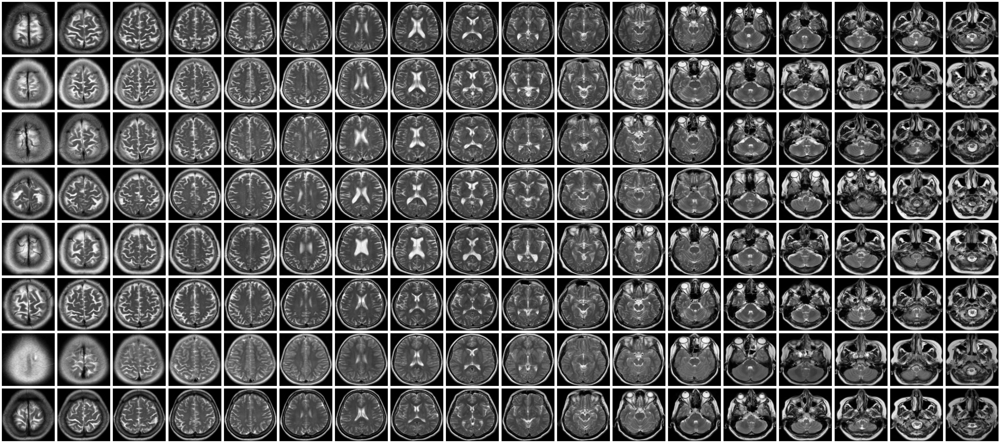

In [41]:
data_iter = iter(val_loaders_T2[1])
batch, labels = next(data_iter)
plot_batch(batch, conv="timm3d")

In [42]:
# For each dataloader, I first set the mean to 0 and the standard deviation to 1 and the conv to '3d', performed the transformation and skull isolation,
    # and then calculated the mean and standard deviation. 
        # After that, I could create the dataloaders again using the precalculated mean and standard deviation
def compute_mean_std(dataloaders):
    # Initialize accumulators
    total_sum = 0.0
    total_squared_sum = 0.0
    total_count = 0

    for dataloader in dataloaders:
        for data, y in dataloader:
            total_sum += data.sum()
            total_squared_sum += (data ** 2).sum()
            total_count += data.numel()

    # Compute mean
    mean = total_sum / total_count

    # Compute variance
    variance = (total_squared_sum / total_count) - mean ** 2

    # Compute standard deviation
    std = torch.sqrt(variance)

    print(f"Mean: {mean.item()}, Standard Deviation: {std.item()}")
    return mean.item(), std.item()

In [43]:
# mean, std = compute_mean_std(train_loaders_T2FLAIR)

# Sample Model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class BasicBlock3D(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock3D, self).__init__()
        self.conv1 = nn.Conv3d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm3d(planes)
        self.conv2 = nn.Conv3d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm3d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion * planes:
            self.shortcut = nn.Sequential(
                nn.Conv3d(in_planes, self.expansion * planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm3d(self.expansion * planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet3D(nn.Module):
    def __init__(self, block, num_blocks, num_classes=1):
        super(ResNet3D, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv3d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm3d(64)
        self.maxpool = nn.MaxPool3d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.avgpool = nn.AdaptiveAvgPool3d((1, 1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.maxpool(out)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.avgpool(out)
        out = torch.flatten(out, 1)
        out = self.fc(out)
        return out


def ResNet34_3D(num_classes=1):
    return ResNet3D(BasicBlock3D, [3, 4, 6, 3], num_classes)


# # Example usage:
# model = ResNet34_3D()
# x = torch.randn(1, 1, 10, 224, 224)
# model(x).shape  # torch.Size([1, 1])

# Training Function

In [45]:
def fit(model, train_loaders, val_loaders, pos_weight, weight_decay=1e-4, lr=1e-3, n_epochs=120, patience=8, early_patience=20):
    # Define the pos_weight directly
    pos_weight_tensor = torch.tensor(pos_weight, dtype=torch.float)
    # Define the loss function with the specified pos_weight
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)
    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    # Learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience)

    model = model.to(device)
    
    patience_counter = 0
    trainLoss = []
    valLoss = []
    trainROC_AUC = []
    valROC_AUC = []
    trainPR_AUC = []
    valPR_AUC = []

    # Evaluation metric of the competition was PR_AUC, so I decided to use this metric for 'evaluating + saving' the best model
    best_PR_AUC = float('-inf')  # Best PR AUC should be initialized to negative infinity
    save_path = f'bestWeights.pth'

    for epoch in range(n_epochs):
        model.train()
        epoch_train_loss = []
        train_true_labels = []
        train_predicted_scores = []
        for train_loader in train_loaders:
            tempLoss = []
            for input, target in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{n_epochs}", leave=False):
                input = input.to(device)
                target = target.to(device).float().view(-1, 1)  # Ensure target is float and reshaped to [batch_size, 1]

                output = model(input)
                
                loss = criterion(output, target)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                tempLoss.append(loss.item())

                # Collect true labels and predicted scores for training PR-AUC
                train_true_labels.extend(target.cpu().numpy())
                train_predicted_scores.extend(torch.sigmoid(output).cpu().detach().numpy())

            epoch_train_loss.append(np.mean(tempLoss))

        trainLoss.append(np.mean(epoch_train_loss))
        

        train_true_labels = np.array(train_true_labels)
        train_predicted_scores = np.array(train_predicted_scores)
        
        # Compute Precision-Recall AUC for training
        train_precision, train_recall, _ = precision_recall_curve(train_true_labels, train_predicted_scores)
        train_pr_auc = auc(train_recall, train_precision)
        trainPR_AUC.append(train_pr_auc)
        
        # Compute ROC-AUC for training
        fpr, tpr, thresholds_roc = roc_curve(train_true_labels, train_predicted_scores)
        roc_auc = auc(fpr, tpr)
        trainROC_AUC.append(roc_auc)

        model.eval()
        val_true_labels = []
        val_predicted_scores = []
        with torch.no_grad():
            epoch_val_loss = []
            for val_loader in val_loaders:
                tempLoss = []
                for input, target in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}/{n_epochs}", leave=False):
                    input = input.to(device)
                    target = target.to(device).float().view(-1, 1)  # Ensure target is float and reshaped to [batch_size, 1]

                    output = model(input)
                    
                    loss = criterion(output, target)
                    tempLoss.append(loss.item())

                    # Collect true labels and predicted scores for validation PR-AUC
                    val_true_labels.extend(target.cpu().numpy())
                    val_predicted_scores.extend(torch.sigmoid(output).cpu().numpy())

                epoch_val_loss.append(np.mean(tempLoss))

            valLoss.append(np.mean(epoch_val_loss))

            val_true_labels = np.array(val_true_labels)
            val_predicted_scores = np.array(val_predicted_scores)
            
            # Compute Precision-Recall AUC for validation
            val_precision, val_recall, _ = precision_recall_curve(val_true_labels, val_predicted_scores)
            val_pr_auc = auc(val_recall, val_precision)
            valPR_AUC.append(val_pr_auc)
            
            # Compute ROC-AUC for training
            fpr, tpr, thresholds_roc = roc_curve(val_true_labels, val_predicted_scores)
            roc_auc = auc(fpr, tpr)
            valROC_AUC.append(roc_auc)
            
            # Early stopping (based on PR-AUC) & Saving the best model
            if valPR_AUC[-1] > best_PR_AUC:  # Save model if PR AUC is higher
                best_PR_AUC = valPR_AUC[-1]
                torch.save(model.state_dict(), save_path)
                print(f"Saved best model with validation PR AUC: {best_PR_AUC:.4f}")
                patience_counter = 0
            else:
                patience_counter += 1
            if patience_counter >= early_patience:
                print(f"Early stopping triggered after {epoch+1} epochs")
                break

        # Step the scheduler with the latest validation loss
        scheduler.step(valLoss[-1])

        # Save all
        saved_path = f"{epoch}.pth"
        torch.save(model.state_dict(), saved_path)
        
        print(f"""epoch: {epoch+1}, trainLoss: {trainLoss[-1]:.4f}, valLoss: {valLoss[-1]:.4f}, 
                trainROC_AUC: {trainROC_AUC[-1]:.4f}, valROC_AUC: {valROC_AUC[-1]:.4f}, 
                trainPR_AUC: {trainPR_AUC[-1]:.4f}, valPR_AUC: {valPR_AUC[-1]:.4f}""")

    # Load the best model before returning
    model.load_state_dict(torch.load(save_path))

    return model, trainLoss, valLoss, trainROC_AUC, valROC_AUC, trainPR_AUC, valPR_AUC, save_path

# Fine-Tunning function

In [46]:
def fineTuneModel(model_path, train_loaders, val_loaders, pos_weight, weight_decay=1e-4, lr=0.001, n_epochs=120, early_patience=20):
    
    # Load the entire model (architecture + params)
    model = torch.jit.load(model_path)
    model = model.to(device)
    
    # Define the pos_weight directly
    pos_weight_tensor = torch.tensor(pos_weight, dtype=torch.float)
    # Define the loss function with the specified pos_weight
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)
    # Optimizer with a lower learning rate for fine-tuning
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    # Learning rate scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=early_patience, verbose=True)
    
    patience_counter = 0
    trainLoss = []
    valLoss = []
    trainROC_AUC = []
    valROC_AUC = []
    trainPR_AUC = []
    valPR_AUC = []
    
    # Evaluation metric of the competition was PR_AUC, so I decided to use this metric for 'evaluating + saving' the best model
    best_PR_AUC = float('-inf')  # Best PR AUC should be initialized to negative infinity
    save_path = 'fineTunedWeights.pth'

    for epoch in range(n_epochs):
        model.train()
        epoch_train_loss = []
        train_true_labels = []
        train_predicted_scores = []
        for train_loader in train_loaders:
            tempLoss = []
            for input, target in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{n_epochs}", leave=False):
                input = input.to(device)
                target = target.to(device).float().view(-1, 1)  # Ensure target is float and reshaped to [batch_size, 1]

                output = model(input)
                
                loss = criterion(output, target)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                tempLoss.append(loss.item())

                # Collect true labels and predicted scores for training PR-AUC
                train_true_labels.extend(target.cpu().numpy())
                train_predicted_scores.extend(torch.sigmoid(output).cpu().detach().numpy())

            epoch_train_loss.append(np.mean(tempLoss))

        trainLoss.append(np.mean(epoch_train_loss))

        train_true_labels = np.array(train_true_labels)
        train_predicted_scores = np.array(train_predicted_scores)
        
        # Compute Precision-Recall AUC for training
        train_precision, train_recall, _ = precision_recall_curve(train_true_labels, train_predicted_scores)
        train_pr_auc = auc(train_recall, train_precision)
        trainPR_AUC.append(train_pr_auc)
        
        # Compute ROC-AUC for training
        fpr, tpr, thresholds_roc = roc_curve(train_true_labels, train_predicted_scores)
        roc_auc = auc(fpr, tpr)
        trainROC_AUC.append(roc_auc)

        model.eval()
        val_true_labels = []
        val_predicted_scores = []
        with torch.no_grad():
            epoch_val_loss = []
            for val_loader in val_loaders:
                tempLoss = []
                for input, target in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}/{n_epochs}", leave=False):
                    input = input.to(device)
                    target = target.to(device).float().view(-1, 1)  # Ensure target is float and reshaped to [batch_size, 1]

                    output = model(input)
                    
                    loss = criterion(output, target)
                    tempLoss.append(loss.item())

                    # Collect true labels and predicted scores for validation PR-AUC
                    val_true_labels.extend(target.cpu().numpy())
                    val_predicted_scores.extend(torch.sigmoid(output).cpu().numpy())

                epoch_val_loss.append(np.mean(tempLoss))

            valLoss.append(np.mean(epoch_val_loss))

            val_true_labels = np.array(val_true_labels)
            val_predicted_scores = np.array(val_predicted_scores)
            
            # Compute Precision-Recall AUC for validation
            val_precision, val_recall, _ = precision_recall_curve(val_true_labels, val_predicted_scores)
            val_pr_auc = auc(val_recall, val_precision)
            valPR_AUC.append(val_pr_auc)
            
            # Compute ROC-AUC for training
            fpr, tpr, thresholds_roc = roc_curve(val_true_labels, val_predicted_scores)
            roc_auc = auc(fpr, tpr)
            valROC_AUC.append(roc_auc)
            
            # Early stopping (based on PR-AUC)
            if valPR_AUC[-1] > best_PR_AUC:  # Save model if PR AUC is higher
                best_PR_AUC = valPR_AUC[-1]
                torch.save(model.state_dict(), save_path)
                print(f"Saved best model with validation PR AUC: {best_PR_AUC:.4f}")
                patience_counter = 0
            else:
                patience_counter += 1
            if patience_counter >= early_patience:
                print(f"Early stopping triggered after {epoch+1} epochs")
                break

        # Step the scheduler with the latest validation loss
        scheduler.step(valLoss[-1])

        print(f"""epoch: {epoch+1}, trainLoss: {trainLoss[-1]:.4f}, valLoss: {valLoss[-1]:.4f},
                trainROC_AUC: {trainROC_AUC[-1]:.4f}, valROC_AUC: {valROC_AUC[-1]:.4f},
                trainPR_AUC: {trainPR_AUC[-1]:.4f}, valPR_AUC: {valPR_AUC[-1]:.4f}""")

    # Load the best model before returning
    model.load_state_dict(torch.load(save_path))

    return model, trainLoss, valLoss, trainROC_AUC, valROC_AUC, trainPR_AUC, valPR_AUC, save_path

# Transfer Learning

In [ ]:
!pip install timm-3d
import timm_3d

In [ ]:
model = timm_3d.create_model(
    'resnext50_32x4d.tv2_in1k',
    pretrained=True,
    num_classes=1,  # Binary classification
    in_chans=1,     # Grayscale images
    global_pool='AdaptivePool3d')

In [ ]:
# Training
model, trainLoss, valLoss, trainROC_AUC, valROC_AUC, trainPR_AUC, valPR_AUC, save_path = fit(
                                model, train_loaders_T1, val_loaders_T1, T1_pos_weight, lr=1e-4, weight_decay=1e-3)

In [ ]:
# Save best model (base params + Architecture)
model.load_state_dict(torch.load(save_path))

path = ".pth"
scripted_model = torch.jit.script(model)
scripted_model.save(path)

# Fine-Tunning

In [ ]:
# Fine-tuning
path = ".pth"
model, trainLoss, valLoss, trainROC_AUC, valROC_AUC, trainPR_AUC, valPR_AUC, save_path = fineTuneModel(path, train_loaders_T2FLAIR, val_loaders_T2FLAIR, T2FLAIR_pos_weight)

In [ ]:
# Save best model (base params + Architecture)
!pip install timm-3d

import timm_3d

model = timm_3d.create_model(
    'resnet50.a1_in1k',
    pretrained=True,
    num_classes=1,  # Binary classification
    in_chans=1,     # Grayscale images
    global_pool='AdaptivePool3d'
)
model.load_state_dict(torch.load(save_path))

path = ".pth"
scripted_model = torch.jit.script(model)
scripted_model.save(path)

# Evaluation

In [ ]:
# For this project, I only had around 1,000 images per series (T1, T2, T2-FLAIR). Since 3D convolutional models are data-hungry, I couldn't allocate a separate test set.
# The competition organizers have informed us that a separate test dataset will be released after the competition concludes. 
# Once the test data is made public, I will update this section accordingly.
# For now, I am using the validation data to evaluate the model's performance.

In [47]:
def evaluate_model(model_path, test_loaders, pos_weight):
    
    # Load the entire model (architecture + params)
    model = torch.jit.load(model_path)
    model = model.to(device)
    
    # Define the loss criterion with the same pos_weight
    pos_weight_tensor = torch.tensor(pos_weight, dtype=torch.float).to(device)
    criterion = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight_tensor)
    
    model.eval()  # Set the model to evaluation mode
    
    test_true_labels = []
    test_predicted_scores = []
    total_loss = 0.0
    
    with torch.no_grad():
        for test_loader in test_loaders:
            for input, target in tqdm(test_loader, desc="Testing"):
                input = input.to(device)
                target = target.to(device).float().view(-1, 1)

                output = model(input)
                loss = criterion(output, target)
                
                total_loss += loss.item()

                # Collect true labels and predicted scores for metric calculation
                test_true_labels.extend(target.cpu().numpy())
                test_predicted_scores.extend(torch.sigmoid(output).cpu().numpy())

    # Convert to numpy arrays
    test_true_labels = np.array(test_true_labels)
    test_predicted_scores = np.array(test_predicted_scores)
    
    # Calculate PR-AUC and ROC-AUC
    precision, recall, _ = precision_recall_curve(test_true_labels, test_predicted_scores)
    pr_auc = auc(recall, precision)
    
    fpr, tpr, _ = roc_curve(test_true_labels, test_predicted_scores)
    roc_auc = auc(fpr, tpr)
    
    avg_loss = total_loss / sum(len(loader) for loader in test_loaders)

    print(f"Test Loss: {avg_loss:.4f}")
    print(f"Test Precision-Recall AUC: {pr_auc:.4f}")
    print(f"Test ROC AUC: {roc_auc:.4f}")

    # confusion matrix
    test_predicted_scores_binary = [1 if point > 0.5 else 0 for point in test_predicted_scores]
    print(f"\nconfusion matrix:")
    plt.figure(figsize=(6, 5))
    cm = confusion_matrix(test_true_labels, test_predicted_scores_binary)
    sns.heatmap(cm, annot=True, cmap="Blues")
    plt.show()
    
    return None

Testing: 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


Test Loss: 0.6360
Test Precision-Recall AUC: 0.6526
Test ROC AUC: 0.8326

confusion matrix:


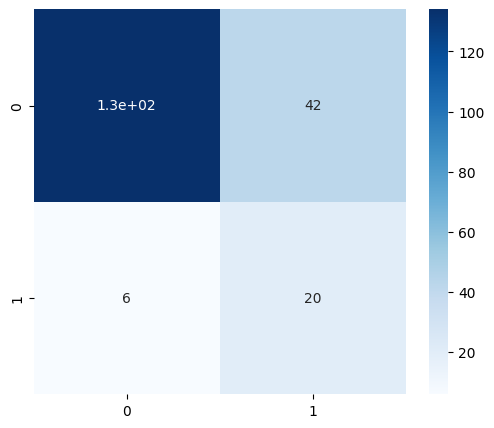

In [48]:
model = "/kaggle/input/wights/T2FLAIR_resnet50.a1_in1k_0.7639.pth"
evaluate_model(model, val_loaders_T2FLAIR, T2FLAIR_pos_weight)

Testing: 100%|██████████| 9/9 [00:12<00:00,  1.35s/it]


Test Loss: 0.9178
Test Precision-Recall AUC: 0.4432
Test ROC AUC: 0.8796

confusion matrix:


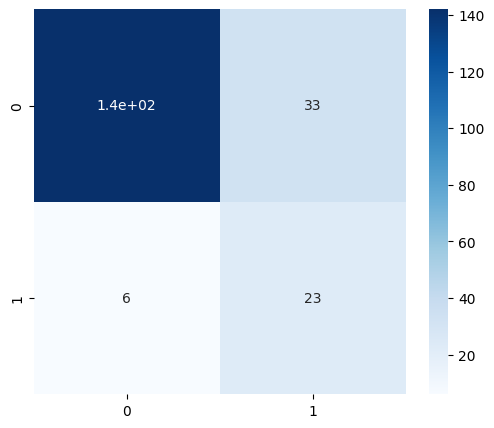

In [49]:
model = "/kaggle/input/wights/T2_resnet50.a1_in1k_0.5841.pth"
evaluate_model(model, val_loaders_T2, T2_pos_weight)

Testing: 100%|██████████| 9/9 [00:12<00:00,  1.34s/it]


Test Loss: 0.7351
Test Precision-Recall AUC: 0.4897
Test ROC AUC: 0.5630

confusion matrix:


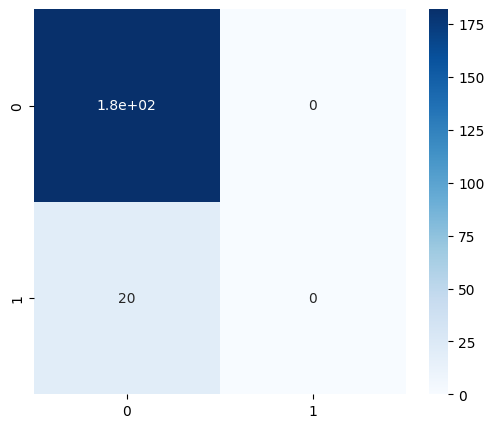

In [50]:
model = "/kaggle/input/wights/T1_resnext50_32x4d.tv2_in1k_0.5143.pth"
evaluate_model(model, val_loaders_T1, T1_pos_weight)

### References
This project uses models from the [timm_3d repository](https://github.com/ZFTurbo/timm_3d). 